# Predicting Level of Severity in Traffic Collisions

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/data-collusions/Data_Collisions.csv


## Table of Contents <a id="ToC"></a>

<div class="alert alert-block alert-info" style="margin-top: 20px">

0. [Project objective](#0)<br>

1. [Import Libraries](#1)<br> 
    
2. [Retrieving Data and Its General Outlook](#2) <br>

3. [Data Manipulation](#3) <br>
 3.1. [Dropping unnecessary columns](#31) <br>
 3.2. [Replacing values and creating new features from time stamp](#32) <br>

4. [Data Exploration ](#4) <br>
 4.1. [Visual Data Exploration ](#41) <br>
 4.2. [Correlations](#42) <br>
 4.3. [Missing Values](#43) <br>

5. [Data Modeling ](#5) <br>
 5.1. [Data Preperation](#51) <br>
 5.2. [Model Execution and Tuning](#52) <br>
    5.2.1. [Logistic Regression Model](#521) <br>
    5.2.2. [Random Forest](#522) <br>
    5.2.3. [LGBM](#523) <br>
    5.2.4. [LGBM - Handling Missing Values Internally](#524) <br>
6. [Model Comparison ](#6) <br>
6.1. [Tuned Models ](#61) <br>
6.2. [Accuracy Scores ](#62) <br>
6.3. [Ensembling Best Models ](#63) <br>

# 0) Project Objective <a id="0"></a>                  [^](#ToC)<br>

- The objective of the project is to build a classifier model to predict the level of severity in case of a traffic collision based on the given the details of the collision. 
- To achieve this purpose the data taken from Seattle Police Department and Seattle Traffic Department will be used. The data is provided by Cursera within the framework of ML Capstone project.
- Nevertheless, first we need to understand, prepare and analyze the data.
- Then, we can use different classification models and compare their performance to come up with the best model. 

# 1) Import Libraries <a id="1"></a>                  [^](#ToC)<br>

In [2]:
!pip install pandas-profiling
!pip install missingno
!pip install mlens

import numpy as np
import pandas as pd
import pandas_profiling
import missingno as msno

import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import RandomizedSearchCV
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_auc_score,roc_curve
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_absolute_error
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier 
from sklearn.ensemble import VotingClassifier
from lightgbm import LGBMClassifier

# Close warnings
import warnings
warnings.filterwarnings('ignore')

# 2) Retrieving Data and Its General Outlook <a id="2"></a>  [^](#ToC)<br>

- The data is taken from Seattle Police Department and Seattle Traffic Department records. It is provided by Cursera within the framework of ML Capstone project.
- It has 38 columns and 194672 rows. 16 columns are numerical and the rest is categorical or object variables. 
- The data includes details of a traffic collision including different types of IDs, location, address, date and time, severity, collision type, number of persons and vehicles, weather, condition of the road etc. 
- We need to look at the details of the data to understand it and to analyze and prepare it to come up with the optimum data for the classification models.
- The data manipulation, EDA and data preprocessing steps will be executed for this purpose. 

In [3]:
df = pd.read_csv('/kaggle/input/data-collusions/Data_Collisions.csv')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 194673 entries, 0 to 194672
Data columns (total 38 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   SEVERITYCODE    194673 non-null  int64  
 1   X               189339 non-null  float64
 2   Y               189339 non-null  float64
 3   OBJECTID        194673 non-null  int64  
 4   INCKEY          194673 non-null  int64  
 5   COLDETKEY       194673 non-null  int64  
 6   REPORTNO        194673 non-null  object 
 7   STATUS          194673 non-null  object 
 8   ADDRTYPE        192747 non-null  object 
 9   INTKEY          65070 non-null   float64
 10  LOCATION        191996 non-null  object 
 11  EXCEPTRSNCODE   84811 non-null   object 
 12  EXCEPTRSNDESC   5638 non-null    object 
 13  SEVERITYCODE.1  194673 non-null  int64  
 14  SEVERITYDESC    194673 non-null  object 
 15  COLLISIONTYPE   189769 non-null  object 
 16  PERSONCOUNT     194673 non-null  int64  
 17  PEDCOUNT  

###  
1. __SEVERITYCODE__: A code that corresponds to the severity of the collision
1. __X__               
1. __Y__               
1. __OBJECTID__: ESRI unique identifier          
1. __INCKEY__: A unique key for the incident            
1. __COLDETKEY__: Secondary key for the incident         
1. __REPORTNO__: Collision report serial number       
1. __STATUS__:         
1. __ADDRTYPE__: Collision address type, Alley, Block, Intersection         
1. __INTKEY__: Key that corresponds to the intersection associated with a collision   
1. __LOCATION__: Description of the general location of the collision         
1. __EXCEPTRSNCODE__:     
1. __EXCEPTRSNDESC__:    
1. __SEVERITYCODE.1__:    
1. __SEVERITYDESC__: A detailed description of the severity of the collision     
1. __COLLISIONTYPE__: Collision type    
1. __PERSONCOUNT__: The total number of people involved in the collision       
1. __PEDCOUNT__: The number of pedestrians involved in the collision     
1. __PEDCYLCOUNT__: The number of bicycles involved in the collision       
1. __VEHCOUNT__: The number of vehicles involved in the collision          
1. __INCDATE__: The date of the incident       
1. __INCDTTM__: The date and time of the incident          
1. __JUNCTIONTYPE__: Category of junction at which collision took place    
1. __SDOT_COLCODE__: A code given to the collision by SDOT    
1. __SDOT_COLDESC__: A description of the collision corresponding to the collision code 
1. __INATTENTIONIND__: Whether or not collision was due to inattention, (Y/N) 
1. __UNDERINFL__: Whether or not a driver involved was under the influence of drugs or alcohol
1. __WEATHER__: A description of the weather conditions during the time of the collision 
1. __ROADCOND__: The condition of the road during the collision        
1. __LIGHTCOND__: The light conditions during the collision.     
1. __PEDROWNOTGRNT__: Whether or not the pedestrian right of way was not granted. (Y/N) 
1. __SDOTCOLNUM__: A number given to the collision by SDOT
1. __SPEEDING__: Whether or not speeding was a factor in the collision. (Y/N)         
1. __ST_COLCODE__: A code provided by the state that describes the collision     
1. __ST_COLDESC__: A description that corresponds to the state’s coding designation
1. __SEGLANEKEY__: A key for the lane segment in which the collision occurred
1. __CROSSWALKKEY__: A key for the crosswalk at which the collision occurred    
1. __HITPARKEDCAR__: Whether or not the collision involved hitting a parked car. (Y/N)

In [5]:
df.profile_report()

# 3) Data Manipulation  <a id="3"></a>  [^](#ToC)<br>

### 3.1) Dropping unnecessary columns   <a id="31"></a>  [^](#ToC)<br>

In [6]:
# The columns below will be dropped due to reasons uncessary or duplicate information or missing values more than 95%.
drop_columns = ['X','Y','INCKEY','COLDETKEY','REPORTNO','INTKEY','LOCATION','EXCEPTRSNCODE','EXCEPTRSNDESC','SEVERITYCODE.1',
                'SEVERITYDESC','INCDATE','SDOT_COLCODE','SDOTCOLNUM','ST_COLCODE','SEGLANEKEY','CROSSWALKKEY']
df = df.drop(drop_columns, axis=1)

### 3.2) Replacing values and creating new features from time stamp  <a id="32"></a>  [^](#ToC)<br>

In [7]:
# In these categorical variables we only have Y as a majority and the rest is missing values.
# We can infer that if the answer was N, this column was left blank, thus we can replace missing values with N. 
df['SPEEDING'].replace(pd.np.nan,'N',inplace=True)
df['PEDROWNOTGRNT'].replace(pd.np.nan,'N',inplace=True)
df['INATTENTIONIND'].replace(pd.np.nan,'N',inplace=True)

In [14]:
# In this variable, we have 4 categories but normally N and 0, Y and 1 are the same categories.
df['UNDERINFL'].replace('0','N', inplace=True)
df['UNDERINFL'].replace('1','Y', inplace=True)
df['UNDERINFL'].value_counts()

N    180668
Y      9121
Name: UNDERINFL, dtype: int64

In [9]:
# Replace 'NOT ENOUGH INFORMATION / NOT APPLICABLE' with NaN.
df['SDOT_COLDESC'].replace(to_replace='NOT ENOUGH INFORMATION / NOT APPLICABLE', value=np.nan, inplace=True)

# Decrease the number of categories by appointing categories with value counts<1000 to a new category called 'OTHER'
SDOT_COLDESC_smaller_categories = df['SDOT_COLDESC'].value_counts()[df['SDOT_COLDESC'].value_counts()<1000].index
for i in df['SDOT_COLDESC']:
    if i in SDOT_COLDESC_smaller_categories:
        df['SDOT_COLDESC'].replace(i, 'OTHER', inplace=True)
df['SDOT_COLDESC'].value_counts()

MOTOR VEHICLE STRUCK MOTOR VEHICLE, FRONT END AT ANGLE      85209
MOTOR VEHICLE STRUCK MOTOR VEHICLE, REAR END                54299
MOTOR VEHICLE STRUCK MOTOR VEHICLE, LEFT SIDE SIDESWIPE      9928
MOTOR VEHICLE RAN OFF ROAD - HIT FIXED OBJECT                8856
MOTOR VEHCILE STRUCK PEDESTRIAN                              6518
MOTOR VEHICLE STRUCK MOTOR VEHICLE, LEFT SIDE AT ANGLE       5852
MOTOR VEHICLE STRUCK OBJECT IN ROAD                          4741
MOTOR VEHICLE STRUCK PEDALCYCLIST, FRONT END AT ANGLE        3104
OTHER                                                        2023
MOTOR VEHICLE STRUCK MOTOR VEHICLE, RIGHT SIDE SIDESWIPE     1604
MOTOR VEHICLE STRUCK MOTOR VEHICLE, RIGHT SIDE AT ANGLE      1440
PEDALCYCLIST STRUCK MOTOR VEHICLE FRONT END AT ANGLE         1312
Name: SDOT_COLDESC, dtype: int64

In [10]:
# Decrease the number of categories by appointing categories with value counts<2000 to a new category called 'OTHER'
df['ST_COLDESC'].value_counts()[df['ST_COLDESC'].value_counts()<2000]
ST_COLDESC_smaller_categories = df['ST_COLDESC'].value_counts()[df['ST_COLDESC'].value_counts()<2000].index
for i in df['ST_COLDESC']:
    if i in ST_COLDESC_smaller_categories:
        df['ST_COLDESC'].replace(i, 'OTHER', inplace=True)
df['ST_COLDESC'].value_counts()

One parked--one moving                                                 44421
Entering at angle                                                      34674
From same direction - both going straight - one stopped - rear-end     25771
Fixed object                                                           13554
From same direction - both going straight - both moving - sideswipe    12777
OTHER                                                                  12717
From opposite direction - one left turn - one straight                 10324
From same direction - both going straight - both moving - rear-end      7629
Vehicle - Pedalcyclist                                                  4701
From same direction - all others                                        4537
From same direction - one left turn - one straight                      3093
From same direction - one right turn - one straight                     2956
Vehicle going straight hits pedestrian                                  2882

In [15]:
# Convert incident date from object to date, extract day and time from INCDTTM column and create new columns. 
# Some of the dates have no hour and the time is converted as 0, thus they are converted into nan values. 
df['INCDTTM'] = pd.to_datetime(df['INCDTTM'])
df['DAY'] = df['INCDTTM'].dt.day_name()
df['TIME'] = df['INCDTTM'].dt.hour
df['TIME'].replace(0, np.nan, inplace=True)
df['MONTH'] = df['INCDTTM'].dt.month
df['MONTH'].replace({1:'Jan',2:'Feb',3:'Mar',4:'Apr',5:'May',6:'Jun',7:'Jul',
                        8:'Aug',9:'Sep',10:'Oct',11:'Nov',12:'Dec'}, inplace=True)

In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 194673 entries, 0 to 194672
Data columns (total 24 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   SEVERITYCODE    194673 non-null  int64         
 1   OBJECTID        194673 non-null  int64         
 2   STATUS          194673 non-null  object        
 3   ADDRTYPE        192747 non-null  object        
 4   COLLISIONTYPE   189769 non-null  object        
 5   PERSONCOUNT     194673 non-null  int64         
 6   PEDCOUNT        194673 non-null  int64         
 7   PEDCYLCOUNT     194673 non-null  int64         
 8   VEHCOUNT        194673 non-null  int64         
 9   INCDTTM         194673 non-null  datetime64[ns]
 10  JUNCTIONTYPE    188344 non-null  object        
 11  SDOT_COLDESC    184886 non-null  object        
 12  INATTENTIONIND  194673 non-null  object        
 13  UNDERINFL       189789 non-null  object        
 14  WEATHER         189592 non-null  obj

# 4) Data Exploration <a id="4"></a>                  [^](#ToC)<br>

## 4.1) Visual Data Exploration   <a id="41"></a>  [^](#ToC)<br>

### Notes from the visualizations with the target variable:
* __Address Type__: Intersection has a higher severity 
* __Collision Type__: Angles, rear end and pedestrian have higher severity.
* __Day__: There are more collisions on Friday and lower on Sunday. 
* __Time__: More collisions and higher severity in the afternoon.

In [18]:
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)

In [19]:
df_var = df.drop(['OBJECTID','INCDTTM'], axis=1)
for col in df_var.columns:
    temp = df_var[col].value_counts()
    df1 = pd.DataFrame({'labels': temp.index,
                       'values': temp.values
                        })
    df1.iplot(kind='pie',labels='labels',values='values', title=col, hole = 0.5)

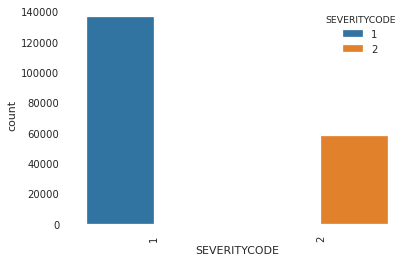

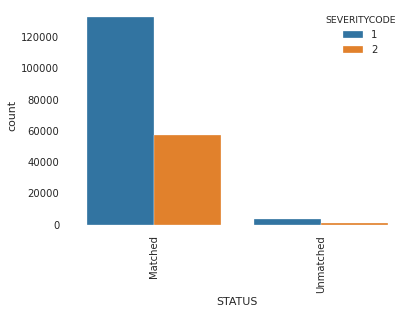

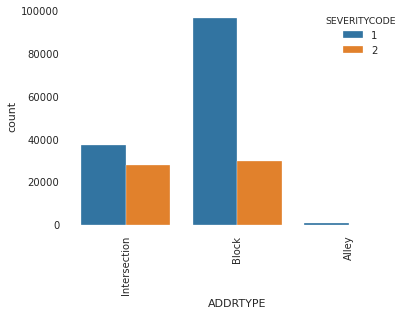

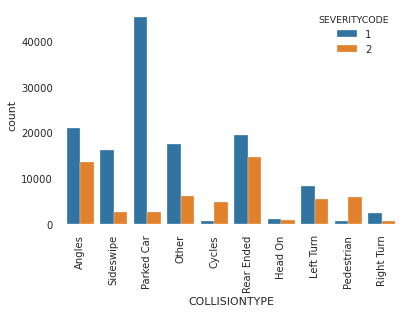

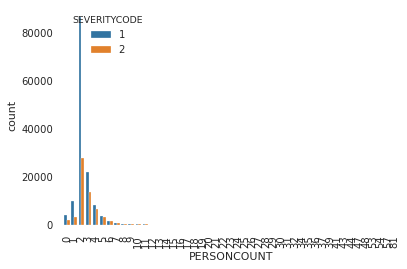

...

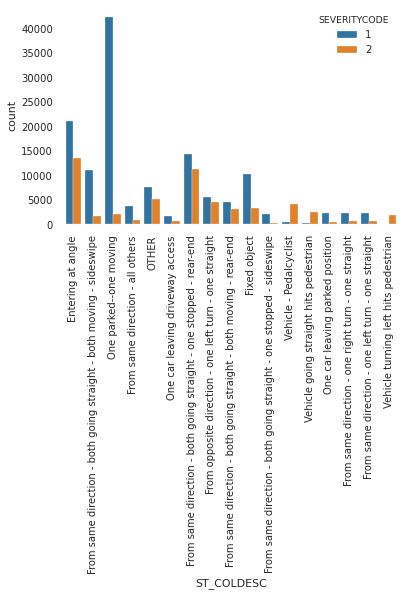

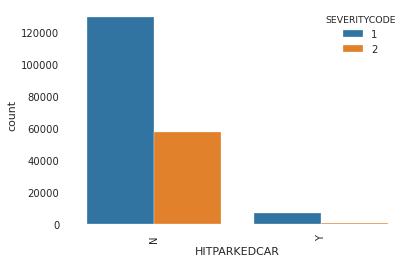

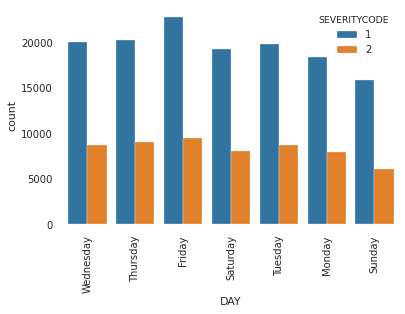

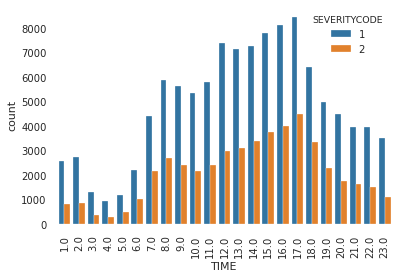

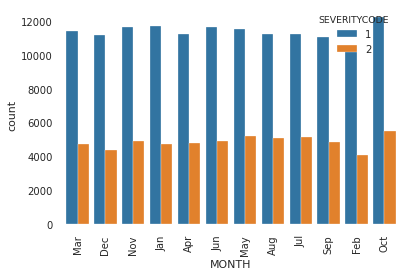

In [20]:
for i, col in enumerate(df_var):
    plt.figure(i)
    plt.xticks(rotation= 90)
    sns.countplot(x=col, hue='SEVERITYCODE', data=df_var)

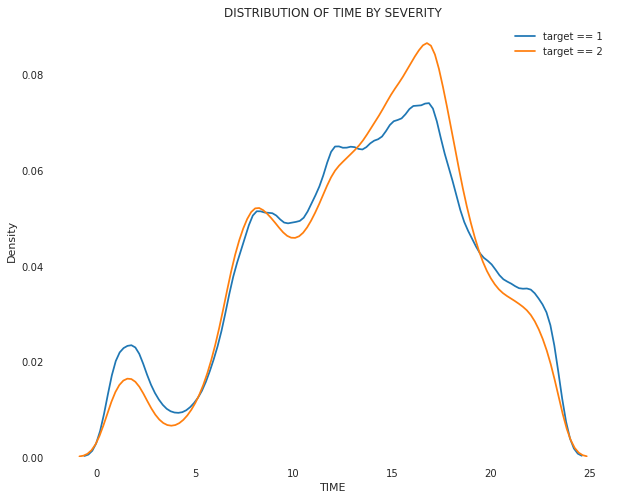

In [21]:
plt.figure(figsize = (10, 8))

sns.kdeplot(df.loc[df['SEVERITYCODE'] == 1, 'TIME'], label = 'target == 1')

sns.kdeplot(df.loc[df['SEVERITYCODE'] == 2, 'TIME'], label = 'target == 2')

# Labeling of plot
plt.xlabel('TIME'); plt.ylabel('Density'); plt.title('DISTRIBUTION OF TIME BY SEVERITY');

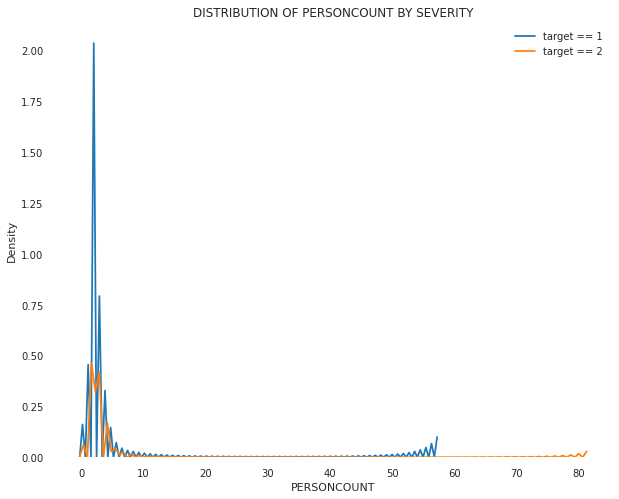

In [22]:
plt.figure(figsize = (10, 8))

sns.kdeplot(df.loc[df['SEVERITYCODE'] == 1, 'PERSONCOUNT'], label = 'target == 1')

sns.kdeplot(df.loc[df['SEVERITYCODE'] == 2, 'PERSONCOUNT'], label = 'target == 2')

# Labeling of plot
plt.xlabel('PERSONCOUNT'); plt.ylabel('Density'); plt.title('DISTRIBUTION OF PERSONCOUNT BY SEVERITY');

### 4.2) Correlations   <a id="42"></a>  [^](#ToC)<br>

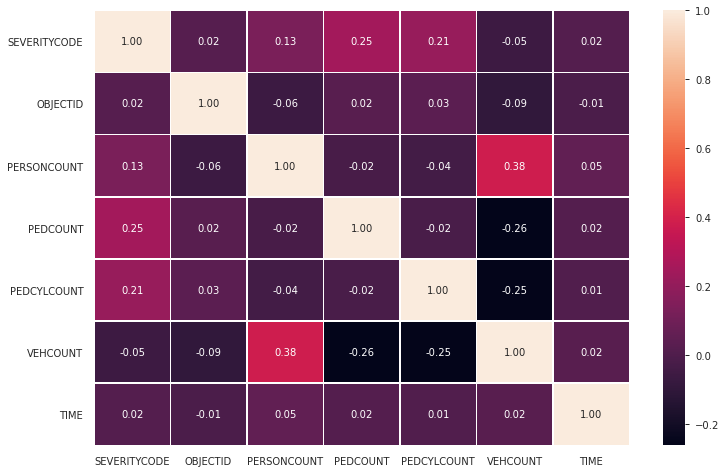

In [24]:
fig, ax = plt.subplots(figsize=(12,8)) 
sns.heatmap(df.iloc[:,0:len(df_var)].corr(), annot = True, fmt = ".2f", linewidths=0.5, ax=ax) 
plt.show()

### 4.3) Missing values   <a id="43"></a>  [^](#ToC)<br>

In [25]:
# Percentages of NaN values after data manipulation. 
# it looks that the percentages of NaN values are reasonable.
total_nan = df.isnull().sum().sort_values(ascending = False)
percent_nan = (df.isnull().sum()/df.isnull().count()*100).sort_values(ascending = False)
missing_df  = pd.concat([total_nan, percent_nan], axis=1, keys=['Total_nan', 'Percent_nan'])
missing_df.head(10)

,Total_nan,Percent_nan
TIME,34381,17.660898
SDOT_COLDESC,9787,5.027405
JUNCTIONTYPE,6329,3.251093
LIGHTCOND,5170,2.655736
WEATHER,5081,2.610018
ROADCOND,5012,2.574574
ST_COLDESC,4904,2.519096
COLLISIONTYPE,4904,2.519096
UNDERINFL,4884,2.508822
ADDRTYPE,1926,0.989351


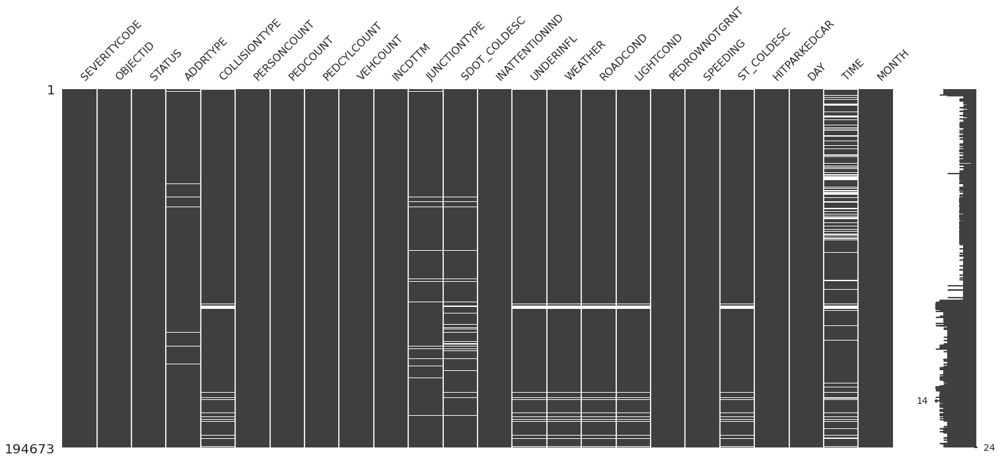

In [26]:
msno.matrix(df);

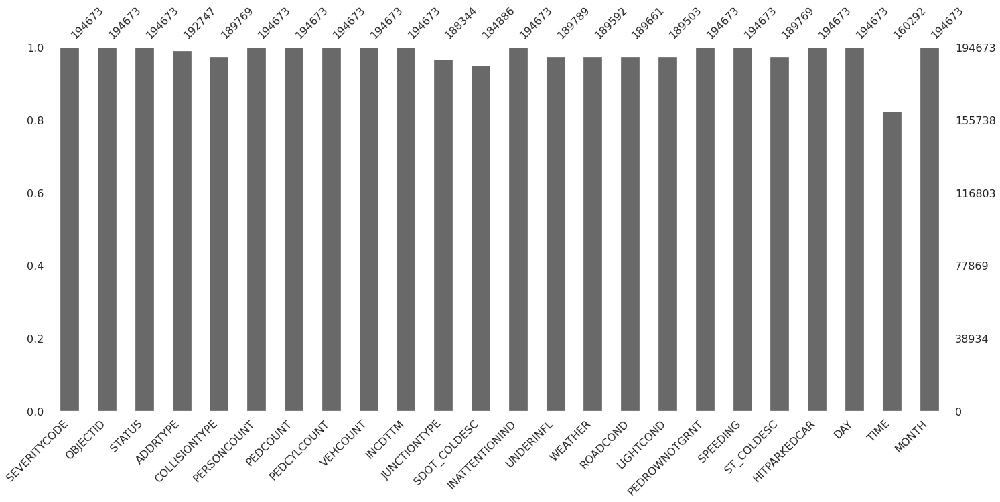

In [27]:
msno.bar(df);

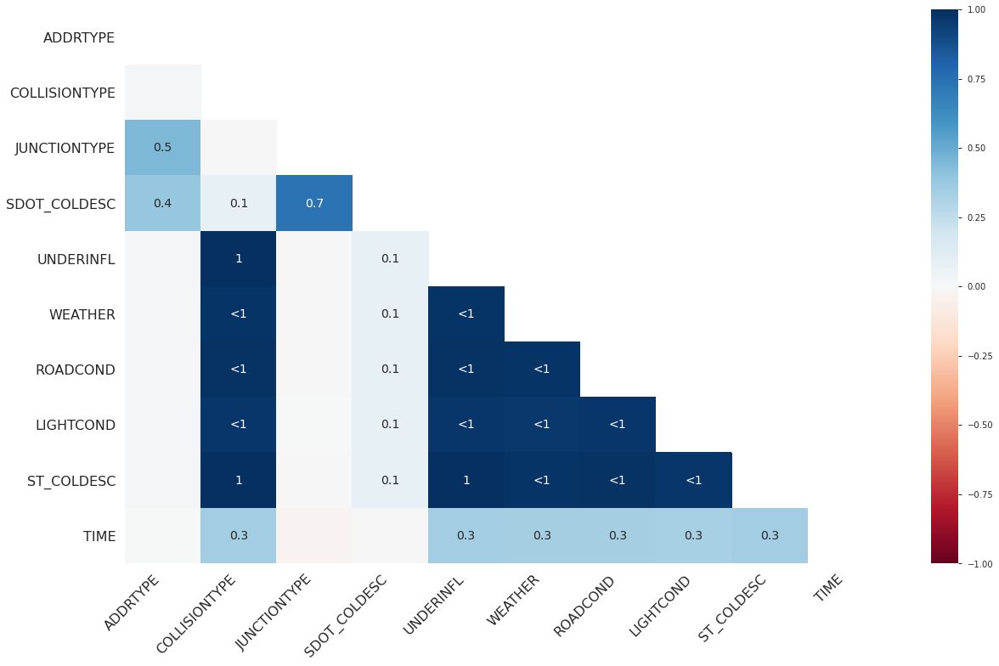

In [28]:
# Nullity correlation
msno.heatmap(df);

# 5) Data Modeling <a id="5"></a>                  [^](#ToC)<br>

## 5.1) Data Preparation   <a id="51"></a>  [^](#ToC)<br>

In [29]:
# binary label encoding
lbe = LabelEncoder()
df['STATUS'] = lbe.fit_transform(df['STATUS'])
df['INATTENTIONIND'] = lbe.fit_transform(df['INATTENTIONIND'])
df['PEDROWNOTGRNT'] = lbe.fit_transform(df['PEDROWNOTGRNT'])
df['SPEEDING'] = lbe.fit_transform(df['SPEEDING'])
df['HITPARKEDCAR'] = lbe.fit_transform(df['HITPARKEDCAR'])

# use replace method since we have nan values in this column and Labelencoder() gives error.  
df['UNDERINFL'].replace({'Y':1, 'N':0}, inplace=True)

In [30]:
df_cat_columns = df.select_dtypes(include=object).columns
df_cat_columns

Index(['ADDRTYPE', 'COLLISIONTYPE', 'JUNCTIONTYPE', 'SDOT_COLDESC', 'WEATHER',
       'ROADCOND', 'LIGHTCOND', 'ST_COLDESC', 'DAY', 'MONTH'],
      dtype='object')

In [31]:
# one hot encoding
df = pd.get_dummies(df, columns=df_cat_columns, drop_first=True)

In [32]:
# some of the category names have spaces, they need to corrected to encounter errors in the ML models
import re
df = df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '_', x))

In [33]:
df.drop(['OBJECTID', 'INCDTTM',], axis=1, inplace=True)

In [34]:
# Making a copy of df with null values
df_with_null = df.copy()
df.columns = df_with_null.columns

In [35]:
# KNN imputation of nan values
imputer = KNNImputer(n_neighbors=5)
df = pd.DataFrame(imputer.fit_transform(df), columns = df_with_null.columns)

In [36]:
# Features and Target Variable

X = df.drop(['SEVERITYCODE'], axis=1)
y = df['SEVERITYCODE']

In [37]:
# Split the data into training/testing sets

X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, shuffle=y, stratify=y, random_state = 42)

In [38]:
# Set cross validation, we use stratified since the target variable is imbalanced

sss = StratifiedShuffleSplit(n_splits=10, test_size=0.2, random_state=42)

In [39]:
# Data with Null Values

X_with_null = df_with_null.drop(['SEVERITYCODE'], axis=1)
y_with_null = df_with_null['SEVERITYCODE']

X_train_with_null, X_test_with_null, y_train_with_null, y_test_with_null= train_test_split(
    X_with_null, y_with_null, test_size=0.2, shuffle=y, stratify=y, random_state = 42)

## 5.2) Model Execution and Tuning    <a id="52"></a>  [^](#ToC)<br><br>

### 5.2.1) Logistic Regression Model  <a id="521"></a>  [^](#ToC)<br>

In [40]:
# Create the model
log_reg = LogisticRegression(random_state=42)

# Fit the model
log_reg.fit(X_train, y_train)

# Predict the model
y_pred = log_reg.predict(X_test)

# Accuracy Score
accuracy_score(y_test, y_pred)

0.758443559779119

In [41]:
#  Model tuning

log_reg_params = {"C":np.logspace(-1, 1, 10),
                  "penalty": ["l1","l2"], 
                  "solver":['lbfgs', 'liblinear', 'sag', 'saga']}
log_reg = LogisticRegression(random_state=42)
log_reg_cv_model = RandomizedSearchCV(log_reg, log_reg_params, cv=sss)
log_reg_cv_model.fit(X_train, y_train)
print("Best score:" + str(log_reg_cv_model.best_score_))
print("Best parameters: " + str(log_reg_cv_model.best_params_))

Best score:0.7575895723641968
Best parameters: {'solver': 'liblinear', 'penalty': 'l1', 'C': 0.46415888336127786}


### 5.2.2) Random Forest  <a id="522"></a>  [^](#ToC)<br>

In [42]:
# Create the model
rf = RandomForestClassifier(random_state=42)

# Fit the model
rf_model = rf.fit(X_train, y_train)

# Predict the model
y_pred = rf_model.predict(X_test)

# Accuracy Score
accuracy_score(y_test, y_pred)

0.7435212533710029

In [43]:
# Model Tuning

rf_params = {"max_depth": [2,5,8,10],
            "max_features": [2,3,5,7],
            "n_estimators": [10,100,200,500,1000],
            "min_samples_split": [2,5,10]}
rf_model = RandomForestClassifier(random_state=42)
rf_cv_model = RandomizedSearchCV(rf_model, 
                           rf_params, 
                           cv = sss, 
                           n_jobs = -1, 
                           verbose = 2) 
rf_cv_model.fit(X_train, y_train)
print("Best score:" + str(rf_cv_model.best_score_))
print("Best Parameters: " + str(rf_cv_model.best_params_))

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed: 11.5min finished


Best score:0.7514061898035187
Best Parameters: {'n_estimators': 100, 'min_samples_split': 10, 'max_features': 7, 'max_depth': 10}


### 5.2.3) LGBM <a id="523"></a>  [^](#ToC)<br>

In [44]:
# Create the model
lgbm = LGBMClassifier(random_state=42)

# Fit the model
lgbm_model = lgbm.fit(X_train, y_train)

# Predict the model
y_pred = lgbm_model.predict(X_test)

# Accuracy Score
accuracy_score(y_test, y_pred)

0.7623988699113908

In [45]:
# Model Tuning

lgbm_params = {
        'n_estimators': [100, 500, 1000, 1500, 2000],
        'subsample': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5, 6],
        'learning_rate': [0.1, 0.01, 0.02, 0.05],
        "min_child_samples": [5, 10, 20]}
lgbm = LGBMClassifier(random_state=42)
lgbm_cv_model = RandomizedSearchCV(lgbm, lgbm_params, 
                             cv = sss, 
                             n_jobs = -1, 
                             verbose = 2)
lgbm_cv_model.fit(X_train, y_train)
print("Best score:" + str(lgbm_cv_model.best_score_))
print("Best parameters: " + str(lgbm_cv_model.best_params_))

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  9.4min finished


Best score:0.7610986259149866
Best parameters: {'subsample': 0.8, 'n_estimators': 1500, 'min_child_samples': 20, 'max_depth': 4, 'learning_rate': 0.02}


### 5.2.4) LGBM - Handling Missing Values Internally <a id="524"></a>  [^](#ToC)<br>

In [46]:
# Create the model
lgbm = LGBMClassifier(random_state=42)

# Fit the model
lgbm_model = lgbm.fit(X_train_with_null, y_train_with_null)

# Predict the model
y_pred_with_null = lgbm_model.predict(X_test_with_null)

# Accuracy Score
accuracy_score(y_test_with_null, y_pred_with_null)

0.7623218184153076

In [47]:
# Model Tuning

lgbm_params = {
        'n_estimators': [100, 500, 1000, 1500, 2000],
        'subsample': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5, 6],
        'learning_rate': [0.1, 0.01, 0.02, 0.05],
        "min_child_samples": [5, 10, 20]}
lgbm = LGBMClassifier(random_state=42)
lgbm_cv_model_with_null = RandomizedSearchCV(lgbm, lgbm_params, 
                             cv = sss, 
                             n_jobs = -1, 
                             verbose = 2)
lgbm_cv_model_with_null.fit(X_train_with_null, y_train_with_null)
print("Best score:" + str(lgbm_cv_model_with_null.best_score_))
print("Best parameters: " + str(lgbm_cv_model_with_null.best_params_))

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:  1.3min
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  7.5min finished


Best score:0.7611467831000385
Best parameters: {'subsample': 1.0, 'n_estimators': 500, 'min_child_samples': 20, 'max_depth': 5, 'learning_rate': 0.05}


# 6) Model Comparison <a id="6"></a>                  [^](#ToC)<br>

## 6.1) Tuned Models <a id="61"></a>  [^](#ToC)<br>

In [48]:
# Tuned Logistic Regression Model

param = log_reg_cv_model.best_params_
log_reg = LogisticRegression(**param, random_state=42)
log_reg_tuned = log_reg.fit(X_train, y_train)
y_pred = log_reg_tuned.predict(X_test)
log_reg_final = accuracy_score(y_test, y_pred)
log_reg_final


0.7592654424040067

In [49]:
# Tuned Random Forest Model 

param = rf_cv_model.best_params_
rf_tuned = RandomForestClassifier(**param, random_state=42)
rf_tuned.fit(X_train, y_train)
y_pred = rf_tuned.predict(X_test)
rf_final = accuracy_score(y_test, y_pred)
rf_final

0.7517143957878516

In [50]:
# Tuned LGBM Model

param = lgbm_cv_model.best_params_
lgbm = LGBMClassifier(**param, random_state=42)
lgbm_tuned = lgbm.fit(X_train, y_train)
y_pred = lgbm_tuned.predict(X_test)
lgbm_final = accuracy_score(y_test, y_pred)
lgbm_final

0.7633748555284449

In [51]:
# feature importances with LGBM

feature_importances = pd.DataFrame({'feature': list(X_train.columns), 
                                    'importance': lgbm_tuned.feature_importances_}).sort_values('importance', ascending = False)

feature_importances.head(10)

,feature,importance
10,TIME,2701
1,PERSONCOUNT,1963
4,VEHCOUNT,979
32,SDOT_COLDESC_MOTOR_VEHICLE_STRUCK_MOTOR_VEHICL...,601
77,ST_COLDESC_One_parked_one_moving,498
5,INATTENTIONIND,491
6,UNDERINFL,491
8,SPEEDING,477
25,JUNCTIONTYPE_Mid_Block_not_related_to_intersec...,452
2,PEDCOUNT,399


In [52]:
# Tuned LGBM Model - Handling Missing Values Internally

param = lgbm_cv_model_with_null.best_params_
lgbm_with_null = LGBMClassifier(**param, random_state=42)
lgbm_tuned = lgbm_with_null.fit(X_train_with_null, y_train_with_null)
y_pred_with_null = lgbm_tuned.predict(X_test_with_null)
lgbm_final_with_null = accuracy_score(y_test_with_null, y_pred_with_null)
lgbm_final_with_null

0.7633748555284449

## 6.2) Accuracy Scores <a id="62"></a>  [^](#ToC)<br>

In [53]:
accuracy_scores = {
'log_reg_final': log_reg_final,
'rf_final': rf_final,
'lgbm_final': lgbm_final,
'lgbm_final_with_null': lgbm_final_with_null,
}

accuracy_scores = pd.Series(accuracy_scores).to_frame('Accuracy_Score')
accuracy_scores = accuracy_scores.sort_values(by='Accuracy_Score', ascending=False)
accuracy_scores['rank'] = (accuracy_scores.reset_index().index +1)
accuracy_scores

,Accuracy_Score,rank
lgbm_final,0.763375,1
lgbm_final_with_null,0.763375,2
log_reg_final,0.759265,3
rf_final,0.751714,4


## 6.3) Ensembling Models <a id="63"></a>  [^](#ToC)<br>

In [54]:
model = [('Logistic Regression', log_reg),
         ('LGBM', lgbm),
         ('Random Forest', rf)
          ]

In [55]:
voting_reg = VotingClassifier(model, voting='hard')
voting_reg.fit(X_train, y_train)
y_pred = voting_reg.predict(X_test)
print(f"Voting Classifier's accuracy: {accuracy_score(y_pred, y_test):.4f}")

Voting Classifier's accuracy: 0.7631


In [56]:
voting_reg = VotingClassifier(model, voting='soft')
voting_reg.fit(X_train, y_train)
y_pred = voting_reg.predict(X_test)
print(f"Voting Classifier's accuracy: {accuracy_score(y_pred, y_test):.4f}")

Voting Classifier's accuracy: 0.7628
